In [1]:
import pandas as pd
import altair as alt

In [65]:
df = pd.read_csv("dump/drg_builds_dataset.csv")

In [197]:
def get_weapon_class(row):
    weapon = row["name"].lower()
    if any(substring in weapon for substring in ["warthog", "voltaic", "smart", "pgl", "breach", "shard"]):
        return "Engineer"
    if any(substring in weapon for substring in ["minigun", "autocannon", "hurricane", "bulldog", "brt7", "armskore"]):
        return "Gunner"
    if any(substring in weapon for substring in ["crspr", "cryo", "corrosive", "subata", "experimental plasma", "colette"]):
        return "Driller"
    if any(substring in weapon for substring in ["gk2", "m1000", "drak-25", "jury-rigged", "zhukov", "nishanka"]):
        return "Scout"

In [198]:
df["class"] = df.apply(get_weapon_class, axis=1)

In [199]:
df = df.replace("Manually Aimed", -1)
df["General Accuracy percentage"] = pd.to_numeric(df["General Accuracy percentage"])
df["Weakpoint Accuracy Percentage"] = pd.to_numeric(df["Weakpoint Accuracy Percentage"])

In [200]:
df.columns

Index(['Ideal (Burst)', 'Weakpoint (Burst)', 'Accuracy (Burst)',
       'Armor Wasting (Burst)', 'Weakpoint + Accuracy (Burst)',
       'Weakpoint + Armor Wasting (Burst)', 'Accuracy + Armor Wasting (Burst)',
       'All three opt-in flags enabled (Burst)', 'Ideal (Sustained)',
       'Weakpoint (Sustained)', 'Accuracy (Sustained)',
       'Armor Wasting (Sustained)', 'Weakpoint + Accuracy (Sustained)',
       'Weakpoint + Armor Wasting (Sustained)',
       'Accuracy + Armor Wasting (Sustained)',
       'All three opt-in flags enabled (Sustained)', 'Additional Target DPS',
       'Theoretical maximum number of targets hit',
       'Theoretical maximum multi-target damage', 'Ammo Efficiency',
       'Percentage of Damage lost to Armor', 'General Accuracy percentage',
       'Weakpoint Accuracy Percentage', 'How long it takes to expend all ammo',
       'Average time to kill', 'Average overkill percentage',
       'Average time to ignite or freeze', 'Damage Per Magazine',
       'Time to

In [201]:
df["class"].value_counts()
col = df["class"].map({"Gunner": "green", "Scout": "blue", "Engineer": "red", "Driller": "yellow"})

## How long to keep killing enemies

<AxesSubplot:xlabel='Average overkill percentage', ylabel='All three opt-in flags enabled (Sustained)'>

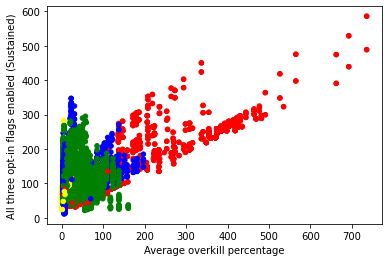

In [219]:
df.plot.scatter(y="All three opt-in flags enabled (Sustained)", x="Average overkill percentage", c=col)

<AxesSubplot:xlabel='Ideal (Burst)', ylabel='Average time to kill'>

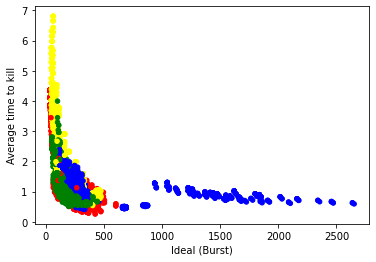

In [46]:
# This one's good. High sustained damage vs. how long you need to keep killing something
df.plot.scatter(x="Ideal (Burst)", y="Average time to kill", c=col)

<AxesSubplot:xlabel='Ideal (Sustained)', ylabel='Average time to kill'>

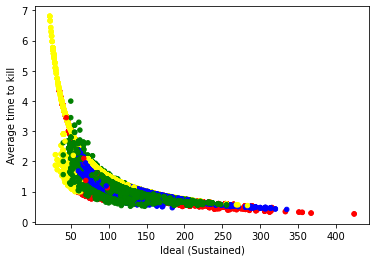

In [47]:
df.plot.scatter(x="Ideal (Sustained)", y="Average time to kill", c=col)

<AxesSubplot:xlabel='Theoretical maximum number of targets hit', ylabel='Ideal (Sustained)'>

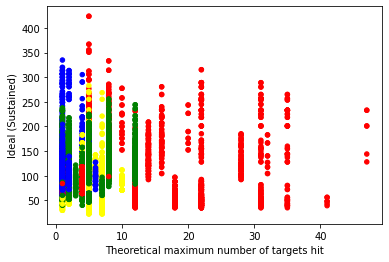

In [55]:
df.plot.scatter(x="Theoretical maximum number of targets hit", y="Ideal (Sustained)", c=col)

## How accurate should you be

<AxesSubplot:xlabel='Ideal (Burst)', ylabel='Accuracy (Burst)'>

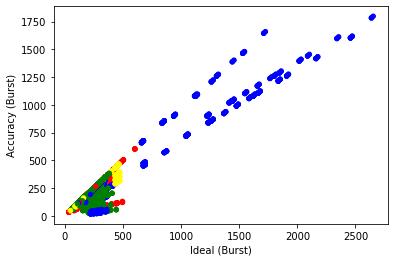

In [48]:
df.plot.scatter(x="Ideal (Burst)", y="Accuracy (Burst)", c=col)

<AxesSubplot:xlabel='Ideal (Sustained)', ylabel='Accuracy (Sustained)'>

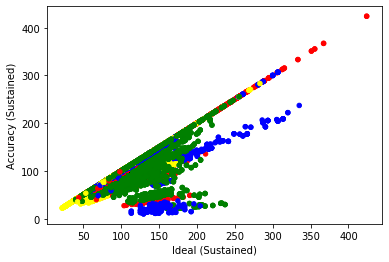

In [49]:
df.plot.scatter(x="Ideal (Sustained)", y="Accuracy (Sustained)", c=col)

<AxesSubplot:xlabel='Weakpoint (Burst)', ylabel='Accuracy (Burst)'>

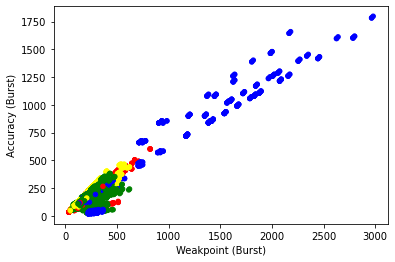

In [51]:
df.plot.scatter(x="Weakpoint (Burst)", y="Accuracy (Burst)", c=col)

<AxesSubplot:xlabel='General Accuracy percentage', ylabel='Ideal (Burst)'>

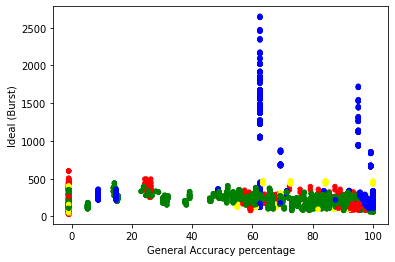

In [74]:
df.plot.scatter(x="General Accuracy percentage", y="Ideal (Burst)", c=col)

<AxesSubplot:xlabel='Weakpoint Accuracy Percentage', ylabel='Weakpoint (Burst)'>

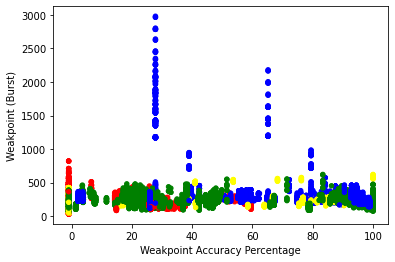

In [210]:
df.plot.scatter(x="Weakpoint Accuracy Percentage", y="Weakpoint (Burst)", c=col)

<AxesSubplot:xlabel='General Accuracy percentage', ylabel='Ideal (Burst)'>

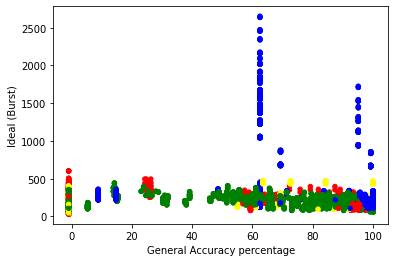

In [213]:
df.plot.scatter(x="General Accuracy percentage", y="Ideal (Burst)", c=col)

## Ammo efficiency

<AxesSubplot:xlabel='How long it takes to expend all ammo', ylabel='Damage Per Magazine'>

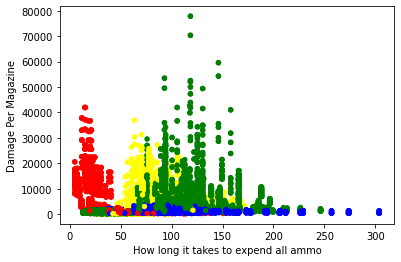

In [76]:
df.plot.scatter(x="How long it takes to expend all ammo",y="Damage Per Magazine", c=col)

# Altair

In [77]:
alt.data_transformers.enable('default', max_rows=None)

DataTransformerRegistry.enable('default')

In [101]:
def vollkorn():
    font = "Vollkorn"
    
    return {
        "config" : {
             "title": {'font': font},
             "axis": {
                  "labelFont": font,
                  "titleFont": font
             },
            "mark": {
                    "font": font,
            }
        }
    }

alt.themes.register('vollkorn', vollkorn)
alt.themes.enable('vollkorn')

ThemeRegistry.enable('vollkorn')

In [186]:
def minmax(df, col):
    return (df[col] - df[col].min()) / (df[col].max() - df[col].min())

In [207]:
ammo_efficiency = df[["class", "name", "How long it takes to expend all ammo", "Damage Per Magazine"]].rename(columns={"How long it takes to expend all ammo": "expend_time", "Damage Per Magazine": "dmg_per_mag"})
ammo_efficiency["expend_time"] = minmax(ammo_efficiency, "expend_time")
ammo_efficiency["dmg_per_mag"] = minmax(ammo_efficiency, "dmg_per_mag")

selector = alt.selection_multi(fields=["class"], bind="legend", init=[{"class": "Driller"}])
base = (
    alt.Chart(ammo_efficiency)
    .mark_circle(size=60)
    .encode(
        x=alt.X("expend_time:Q", title="How long it takes to expend all ammo"),
        y=alt.Y("dmg_per_mag:Q", title="Damage per magazine"),
        color=alt.condition(
            selector,
            alt.Color(
                "class:N",
                scale={"range": ["#a00000"]},
                legend=alt.Legend(title="Class", labelFont="Lato", labelFontSize=14),
            ),
            alt.value("#dedede"),
        ),
        opacity=alt.value(0.5)
    )
)

chart = alt.layer(
    base.add_selection(selector),
    base.transform_filter(selector).encode(tooltip=["name", "class"])
)

chart = (
    chart
    .interactive()
    .properties(height=400, width=500)
    .configure(background="#fffff8")
    .configure_axis(labelFontSize=14, titleFontSize=18, grid=False)
    .configure_view(stroke=None)
    .configure_text(font="Lato", fontWeight=200)  
)
chart.save("ammo_efficiency.html")
chart

alt.LayerChart(...)

In [223]:
sus_opt_in = "All three opt-in flags enabled (Sustained)"
overkill = "Average overkill percentage"

source = df[["class", "name", sus_opt_in, overkill]]
source[sus_opt_in] = minmax(source, sus_opt_in)
source[overkill] = minmax(source, overkill)

selector = alt.selection_multi(
    fields=["class"], bind="legend", init=[{"class": "Driller"}]
)
base = (
    alt.Chart(source)
    .mark_circle(size=60)
    .encode(
        x=alt.X(f"{overkill}:Q"),
        y=alt.Y(f"{sus_opt_in}:Q", title="Sustained DPS"),
        color=alt.condition(
            selector,
            alt.Color(
                "class:N",
                scale={"range": ["#a00000"]},
                legend=alt.Legend(title="Class", labelFont="Lato", labelFontSize=14),
            ),
            alt.value("#dedede"),
        ),
        opacity=alt.value(0.5),
    )
)

chart = alt.layer(
    base.add_selection(selector),
    base.transform_filter(selector).encode(tooltip=["name", "class"]),
)

chart = (
    chart.interactive()
    .properties(height=400, width=500)
    .configure(background="#fffff8")
    .configure_axis(labelFontSize=14, titleFontSize=18, grid=False)
    .configure_view(stroke=None)
    .configure_text(font="Lato", fontWeight=200)
)
chart.save("sustained_damage.html")
chart

/tmp/ipykernel_11788/2622805857.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  source[sus_opt_in] = minmax(source, sus_opt_in)
/tmp/ipykernel_11788/2622805857.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  source[overkill] = minmax(source, overkill)


alt.LayerChart(...)

In [225]:
source = df[
    [
        "class",
        "name",
        "Theoretical maximum number of targets hit",
        "Theoretical maximum multi-target damage",
    ]
]
source["Theoretical maximum multi-target damage"] = minmax(
    source, "Theoretical maximum multi-target damage"
)
source["Theoretical maximum number of targets hit"] = minmax(
    source, "Theoretical maximum number of targets hit"
)

selector = alt.selection_multi(
    fields=["class"], bind="legend", init=[{"class": "Driller"}]
)
base = (
    alt.Chart(source)
    .mark_circle(size=60)
    .encode(
        y=alt.Y("Theoretical maximum multi-target damage:Q"),
        x=alt.X("Theoretical maximum number of targets hit:Q"),
        color=alt.condition(
            selector,
            alt.Color(
                "class:N",
                scale={"range": ["#a00000"]},
                legend=alt.Legend(title="Class", labelFont="Lato", labelFontSize=14),
            ),
            alt.value("#dedede"),
        ),
        opacity=alt.value(0.5),
    )
)

chart = alt.layer(
    base.add_selection(selector),
    base.transform_filter(selector).encode(tooltip=["name", "class"]),
)

chart = (
    chart.interactive()
    .properties(height=400, width=500)
    .configure(background="#fffff8")
    .configure_axis(labelFontSize=14, titleFontSize=18, grid=False)
    .configure_view(stroke=None)
    .configure_text(font="Lato", fontWeight=200)
)
chart.save("aoe_damage.html")
chart

/tmp/ipykernel_11788/1504091611.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  source["Theoretical maximum multi-target damage"] = minmax(
/tmp/ipykernel_11788/1504091611.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  source["Theoretical maximum number of targets hit"] = minmax(


alt.LayerChart(...)

## UMAP

In [233]:
import umap
from sklearn.preprocessing import StandardScaler

In [256]:
help(umap.UMAP)

Help on class UMAP in module umap.umap_:

class UMAP(sklearn.base.BaseEstimator)
 |  UMAP(n_neighbors=15, n_components=2, metric='euclidean', metric_kwds=None, output_metric='euclidean', output_metric_kwds=None, n_epochs=None, learning_rate=1.0, init='spectral', min_dist=0.1, spread=1.0, low_memory=True, n_jobs=-1, set_op_mix_ratio=1.0, local_connectivity=1.0, repulsion_strength=1.0, negative_sample_rate=5, transform_queue_size=4.0, a=None, b=None, random_state=None, angular_rp_forest=False, target_n_neighbors=-1, target_metric='categorical', target_metric_kwds=None, target_weight=0.5, transform_seed=42, transform_mode='embedding', force_approximation_algorithm=False, verbose=False, tqdm_kwds=None, unique=False, densmap=False, dens_lambda=2.0, dens_frac=0.3, dens_var_shift=0.1, output_dens=False, disconnection_distance=None, precomputed_knn=(None, None, None))
 |  
 |  Uniform Manifold Approximation and Projection
 |  
 |  Finds a low dimensional embedding of the data that approximates

In [268]:
reducer = umap.UMAP(n_neighbors=150, n_components=2, min_dist=0.2, metric="cosine")
numerical_df = df[[col for col in df.columns if col not in ["name", "class"]]].fillna(-1)
data = numerical_df.values
scaled_data = StandardScaler().fit_transform(data)
embedding = reducer.fit_transform(scaled_data)

embedding_df = df[["class", "name"]]
embedding_df["x"] = embedding[:,0]
embedding_df["y"] = embedding[:,1]

/tmp/ipykernel_11788/1240851852.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  embedding_df["x"] = embedding[:,0]
/tmp/ipykernel_11788/1240851852.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  embedding_df["y"] = embedding[:,1]


In [293]:
scatter = (
    alt.Chart(embedding_df)
    .mark_circle(size=60)
    .encode(
        y=alt.Y("y", axis=None),
        x=alt.X("x", axis=None),
        color=alt.Color(
            "class",
            sort=["Scout", "Driller", "Engineer", "Gunner"],
            legend=alt.Legend(
                title=None,
                labelFontSize=14,
                labelFont="Lato",
                direction="horizontal",
                titleAnchor="middle",
                orient="none",
                legendX=125,
                legendY=480,
            ),
        ),
        tooltip=["class", "name"],
        opacity=alt.value(0.3),
    )
)
chart = (
    scatter.interactive()
    .properties(height=500, width=500)
    .configure(background="#fffff8")
    .configure_axis(labelFontSize=14, titleFontSize=18, grid=False)
    .configure_view(stroke=None)
    .configure_text(font="Lato", fontWeight=200)
)
chart.save("umap.html")
chart

alt.Chart(...)

In [275]:
scatter = (
    alt.Chart(embedding_df)
    .mark_circle(size=60)
    .encode(
        y=alt.Y("y", axis=None),
        x=alt.X("x", axis=None),
        color=alt.Color(
            "class",
            sort=["Scout", "Driller", "Engineer", "Gunner"],
            legend=None,
        ),
        tooltip=["class", "name"],
        opacity=alt.value(0.3),
    )
)
chart = (
    scatter.interactive()
    .properties(height=400, width=700)
    .configure(background="#fffff8")
    .configure_axis(labelFontSize=14, titleFontSize=18, grid=False)
    .configure_view(stroke=None)
    .configure_text(font="Lato", fontWeight=200)
)

chart

alt.Chart(...)